In [125]:
!pip install prophet

In [126]:
!python.exe -m pip install --upgrade pip

In [127]:
import pandas as pd
from prophet import Prophet

In [128]:
url_df = 'C:/Users/pcardoso/Documents/coding/prophet_via/VIA_ride_requests_2021-2024_CSV.csv'


In [129]:
df = pd.read_csv(url_df, encoding='latin-1')


C:\Users\pcardoso\AppData\Local\Temp\ipykernel_25736\78021795.py:1: DtypeWarning:

Columns (7,45) have mixed types. Specify dtype option on import or set low_memory=False.



In [130]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160982 entries, 0 to 160981
Data columns (total 49 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Request Creation Date           160982 non-null  object 
 1   Request Creation Time           160982 non-null  object 
 2   Session ID                      150928 non-null  float64
 3   Request ID                      160982 non-null  int64  
 4   Series ID                       0 non-null       float64
 5   Request Status                  160982 non-null  object 
 6   Rider ID                        160982 non-null  int64  
 7   Driver ID                       137075 non-null  object 
 8   Vehicle ID                      137459 non-null  float64
 9   Latest shift ID                 0 non-null       float64
 10  Is WAV Request                  160982 non-null  object 
 11  Number of Required Wheelchairs  150928 non-null  float64
 12  Booking Method  

In [131]:
df

,Request Creation Date,Request Creation Time,Session ID,Request ID,Series ID,Request Status,Rider ID,Driver ID,Vehicle ID,Latest shift ID,...,Actual Pickup Address,Ride Distance,Ride Duration,Actual Dropoff Address,Ride Rating (1-5),Ride feedback,Feedback Labels,Vendor Name,Corporate ID,Corporate Name
0,2022-02-18,2022-02-18 12:03:21,37946.0,37946,NaN,Completed,436,18,16.0,NaN,...,"Tache Ave & Provencher Blvd, Tache Ave",1.8,7.8,"Marion St & Kenny St, Marion St 186",3.0,NaN,Wrong ETA,no vendor,NaN,NaN
1,2022-03-08,2022-03-08 20:05:47,43303.0,43303,NaN,Completed,112,14,14.0,NaN,...,St Vital Shopping Center,7.0,15.4,"Plaza Dr, Plaza Dr",1.0,NaN,Wrong ETA,no vendor,NaN,NaN
2,2022-04-27,2022-04-27 13:08:53,55268.0,55268,NaN,Completed,265,27,14.0,NaN,...,"WB Av. de la Cathedrale (Chez Nous), Av. de l...",1.3,3.9,"WB Goulet St & Kenny St (No Frills), Goulet St...",1.0,NaN,Wrong ETA,no vendor,NaN,NaN
3,2022-05-15,2022-05-15 23:18:28,60144.0,60144,NaN,Completed,467,29,13.0,NaN,...,Pembina at Plaza NB,2.4,5.1,"Avalon Rd & Metz St, Avalon Rd",3.0,NaN,Wrong ETA,no vendor,NaN,NaN
4,2022-05-25,2022-05-25 20:12:15,62818.0,62818,NaN,Completed,467,29,13.0,NaN,...,NaN,3.2,8.8,"Avalon Rd & Metz St, Avalon Rd",3.0,NaN,Wrong ETA,no vendor,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160977,2024-07-14,2024-07-14 23:23:17,513285.0,513285,NaN,Not Accepted,7926,29.0,13.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no vendor,NaN,NaN
160978,2024-07-14,2024-07-14 23:41:13,513290.0,513290,NaN,Not Accepted,4366,29.0,13.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no vendor,NaN,NaN
160979,2024-07-14,2024-07-14 23:48:50,513292.0,513292,NaN,No-Showed,5228,29.0,13.0,NaN,...,"Metz St & Avalon Rd, Metz St 12",NaN,NaN,"Meadowood Dr, Meadowood Dr",NaN,NaN,NaN,no vendor,NaN,NaN
160980,2024-07-14,2024-07-14 23:50:44,513294.0,513294,NaN,Completed,3390,29.0,13.0,NaN,...,Pembina Hwy,4.3,5.2,"Bishop @ Dakota (eastbound), Bishop Grandin Blvd",NaN,NaN,NaN,no vendor,NaN,NaN


C:\Users\pcardoso\AppData\Local\Temp\ipykernel_25736\1522780934.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\pcardoso\AppData\Local\Temp\ipykernel_25736\1522780934.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

14:21:25 - cmdstanpy - INFO - Chain [1] start processing
14:21:32 - cmdstanpy - INFO - Chain [1] done processing
c:\Users\pcardoso\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\forecaster.py:1854: FutureWarning:

'H' is deprecated and will be removed in a futu

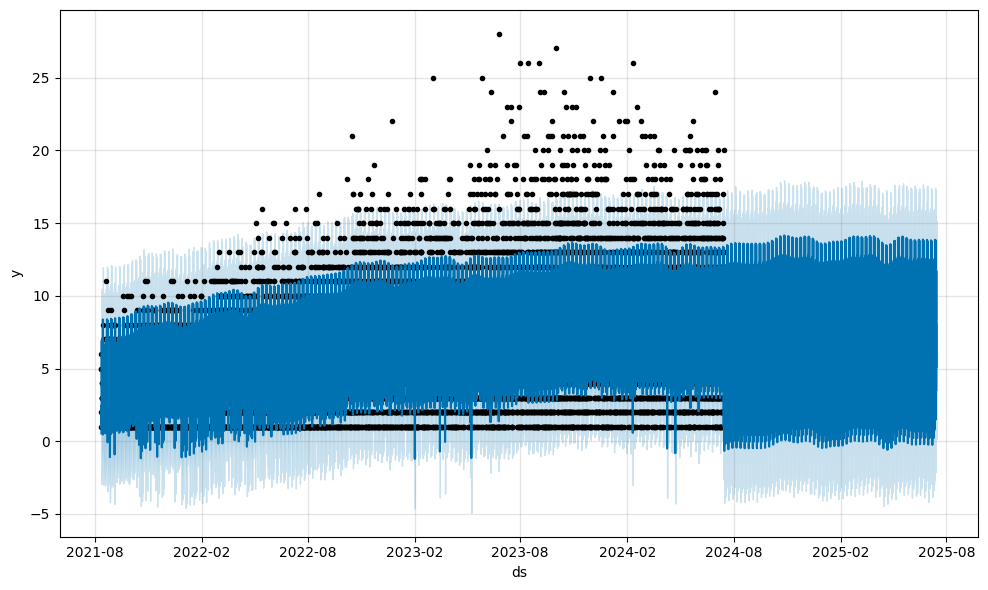

In [132]:
df['ds'] = pd.to_datetime(df['Actual Pickup Time'], errors='coerce')

# Drop rows with NaT in 'ds' column
df = df.dropna(subset=['ds'])

# Aggregate trips by day and hour
df['date'] = df['ds'].dt.date
df['hour'] = df['ds'].dt.hour

# Group by date and hour and count trips
agg_data = df.groupby(['date', 'hour']).size().reset_index(name='y')

# Create a datetime column for Prophet
agg_data['ds'] = pd.to_datetime(agg_data['date'].astype(str) + ' ' + agg_data['hour'].astype(str) + ':00:00')

# Drop the now redundant columns
agg_data = agg_data.drop(columns=['date', 'hour'])

# Initialize Prophet model
model = Prophet()

# Fit the model
model.fit(agg_data)

# Create a future DataFrame for prediction
future = model.make_future_dataframe(periods=365*24, freq='H')  # Predicting hourly for a year

# Predict
forecast = model.predict(future)

# Visualize the forecast
fig = model.plot(forecast)

c:\Users\pcardoso\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\pcardoso\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:397: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\pcardoso\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:401: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.ar

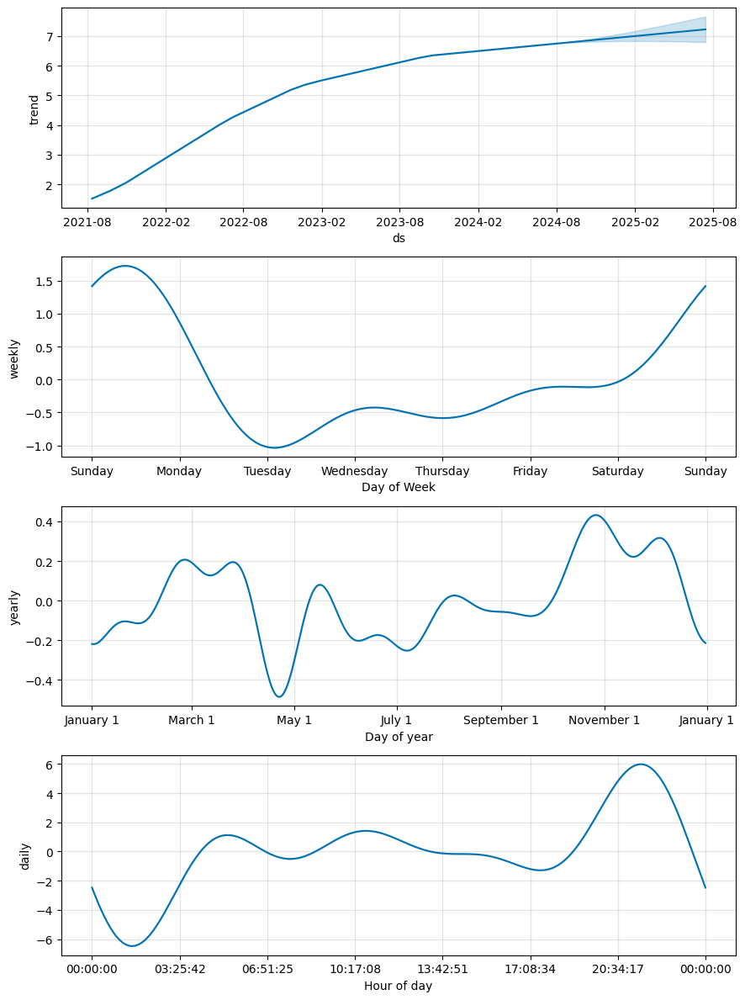

In [133]:
fig2 = model.plot_components(forecast)


In [134]:
from prophet.plot import plot_plotly, plot_components_plotly
fig = plot_plotly(model, forecast)
fig.show()

# Plot the forecast components using Plotly
fig_components = plot_components_plotly(model, forecast)
fig_components.show()

In [135]:
from prophet.plot import plot_plotly
import plotly.io as pio

# Generate the plot
fig = plot_plotly(model, forecast)

# Save the plot as an HTML file
pio.write_html(fig, file='forecast_plot.html', auto_open=True)


# Generate the components plot
fig_components = plot_components_plotly(model, forecast)

# Save the components plot as an HTML file
pio.write_html(fig_components, file='forecast_components_plot.html', auto_open=True)


In [136]:
!pip install plotly


In [137]:
import plotly.graph_objs as go

In [138]:
!pip install ipywidgets



In [139]:
!pip install nbformat --upgrade


In [140]:
!pip install nbformat

C:\Users\pcardoso\AppData\Local\Temp\ipykernel_25736\3920341145.py:5: DtypeWarning:

Columns (7,45) have mixed types. Specify dtype option on import or set low_memory=False.



Average Trips per Vehicle per Hour: 3.444514834758737


14:21:57 - cmdstanpy - INFO - Chain [1] start processing
14:22:02 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\pcardoso\AppData\Local\Temp\ipykernel_25736\3920341145.py:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



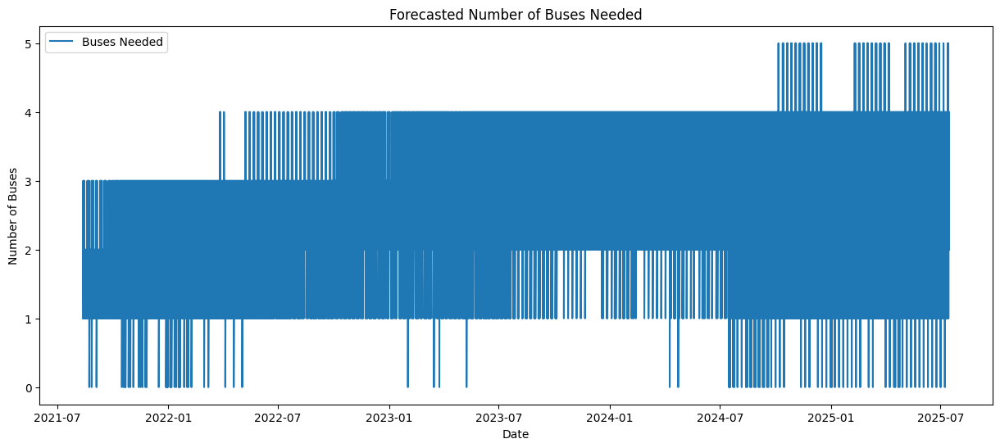

In [141]:
#Calculate the AVG buses per hour

# Load the data
url_df = 'C:/Users/pcardoso/Documents/coding/prophet_via/VIA_ride_requests_2021-2024_CSV.csv'
df = pd.read_csv(url_df, encoding='latin-1')

# Convert relevant columns to datetime
df['Actual Pickup Time'] = pd.to_datetime(df['Actual Pickup Time'], errors='coerce')
df['Actual Dropoff Time'] = pd.to_datetime(df['Actual Dropoff Time'], errors='coerce')

# Drop rows with NaT in 'Actual Pickup Time' or 'Actual Dropoff Time'
df = df.dropna(subset=['Actual Pickup Time', 'Actual Dropoff Time'])

# Calculate trip duration in minutes
df['Trip Duration'] = (df['Actual Dropoff Time'] - df['Actual Pickup Time']).dt.total_seconds() / 60

# Aggregate trips by Vehicle ID, date and hour
df['date'] = df['Actual Pickup Time'].dt.date
df['hour'] = df['Actual Pickup Time'].dt.hour

# Group by Vehicle ID, date and hour and count trips
vehicle_hourly_trips = df.groupby(['Vehicle ID', 'date', 'hour']).size().reset_index(name='trips')

# Calculate the average number of trips per vehicle per hour
avg_trips_per_vehicle_per_hour = vehicle_hourly_trips['trips'].mean()
print(f'Average Trips per Vehicle per Hour: {avg_trips_per_vehicle_per_hour}')

# Aggregate total trips by date and hour for forecasting
agg_data = df.groupby(['date', 'hour']).size().reset_index(name='y')

# Create a datetime column for Prophet
agg_data['ds'] = pd.to_datetime(agg_data['date'].astype(str) + ' ' + agg_data['hour'].astype(str) + ':00:00')

# Drop the now redundant columns
agg_data = agg_data.drop(columns=['date', 'hour'])

# Initialize Prophet model
model = Prophet()

# Fit the model
model.fit(agg_data)

# Create a future DataFrame for prediction
future = model.make_future_dataframe(periods=365*24, freq='h')  # Predicting hourly for a year

# Predict
forecast = model.predict(future)

# Extract the forecasted number of trips
forecasted_trips = forecast[['ds', 'yhat']]

# Calculate the number of buses needed per hour
def calculate_buses_needed(trips, avg_trips_per_vehicle_per_hour):
    buses_needed = (trips / avg_trips_per_vehicle_per_hour).apply(np.ceil)
    return buses_needed

# Apply the calculation
forecasted_trips['buses_needed'] = calculate_buses_needed(forecasted_trips['yhat'], avg_trips_per_vehicle_per_hour)

# Visualize the forecasted number of buses needed
plt.figure(figsize=(15, 6))
plt.plot(forecasted_trips['ds'], forecasted_trips['buses_needed'], label='Buses Needed')
plt.xlabel('Date')
plt.ylabel('Number of Buses')
plt.title('Forecasted Number of Buses Needed')
plt.legend()
plt.show()


In [142]:
forecast[['ds', 'yhat']]

,ds,yhat
0,2021-08-12 08:00:00,0.531206
1,2021-08-12 09:00:00,1.275306
2,2021-08-12 10:00:00,2.214096
3,2021-08-12 11:00:00,2.441253
4,2021-08-12 12:00:00,1.885697
...,...,...
24299,2025-07-14 20:00:00,9.344226
24300,2025-07-14 21:00:00,11.705676
24301,2025-07-14 22:00:00,11.556089
24302,2025-07-14 23:00:00,8.285662


In [143]:
df['Actual Pickup Time']

0        2022-02-18 12:14:51
1        2022-03-08 20:11:38
2        2022-04-27 13:18:07
3        2022-05-15 23:40:47
4        2022-05-25 20:45:41
                 ...        
160971   2024-07-14 23:20:13
160972   2024-07-14 23:20:01
160975   2024-07-14 23:31:19
160976   2024-07-14 23:32:30
160980   2024-07-15 00:07:22
Name: Actual Pickup Time, Length: 97869, dtype: datetime64[ns]

In [144]:
df['Request Creation Date']

0         2022-02-18
1         2022-03-08
2         2022-04-27
3         2022-05-15
4         2022-05-25
             ...    
160971    2024-07-14
160972    2024-07-14
160975    2024-07-14
160976    2024-07-14
160980    2024-07-14
Name: Request Creation Date, Length: 97869, dtype: object

In [145]:
# Convert the Actual Pickup Time to datetime
df['Actual Pickup Time'] = pd.to_datetime(df['Actual Pickup Time'], errors='coerce')

# Drop rows with NaT in 'Actual Pickup Time'
df = df.dropna(subset=['Actual Pickup Time'])

# Count the number of requests per day
daily_pickups = df.groupby(df['Actual Pickup Time'].dt.date).size().reset_index(name='y')
daily_pickups.columns = ['ds', 'y']

# Convert 'ds' back to datetime
daily_pickups['ds'] = pd.to_datetime(daily_pickups['ds'])

# Summarize the prepared data
print(daily_pickups.head())


          ds   y
0 2021-08-12  42
1 2021-08-13  31
2 2021-08-14  37
3 2021-08-15  40
4 2021-08-16  35


In [146]:

# Define the model
model = Prophet()

# Fit the model
model.fit(daily_pickups)


14:22:08 - cmdstanpy - INFO - Chain [1] start processing
14:22:08 - cmdstanpy - INFO - Chain [1] done processing


          ds       yhat  yhat_lower  yhat_upper
0 2021-08-12  27.616109    9.082774   45.394264
1 2021-08-13  27.588982    9.395029   46.865478
2 2021-08-14  61.501974   42.388611   78.716267
3 2021-08-15  79.127733   60.520142   96.376274
4 2021-08-16  24.022762    5.150008   41.593134


c:\Users\pcardoso\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\pcardoso\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



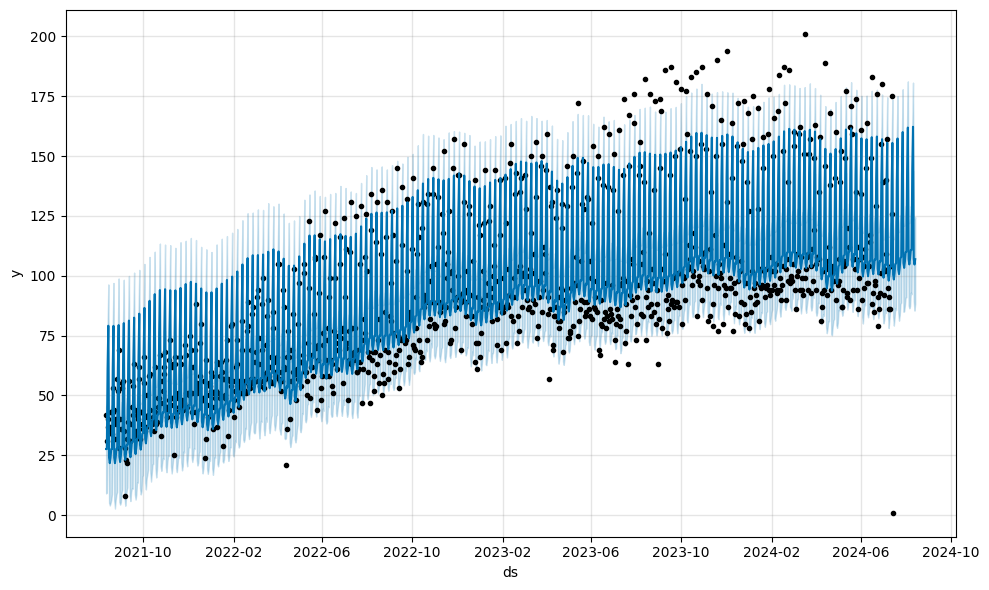

In [147]:
# Define the period for which we want a prediction (in-sample)
future = model.make_future_dataframe(periods=30)  # Extend by 30 days

# Use the model to make a forecast
forecast = model.predict(future)

# Summarize the forecast
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())

# Plot forecast
model.plot(forecast)
plt.show()


          ds       yhat  yhat_lower  yhat_upper
0 2021-08-12  27.616109    8.347543   45.414388
1 2021-08-13  27.588982    8.257783   45.524339
2 2021-08-14  61.501974   42.863705   79.835157
3 2021-08-15  79.127733   59.877533   97.035258
4 2021-08-16  24.022762    6.549767   43.034194


c:\Users\pcardoso\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\pcardoso\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



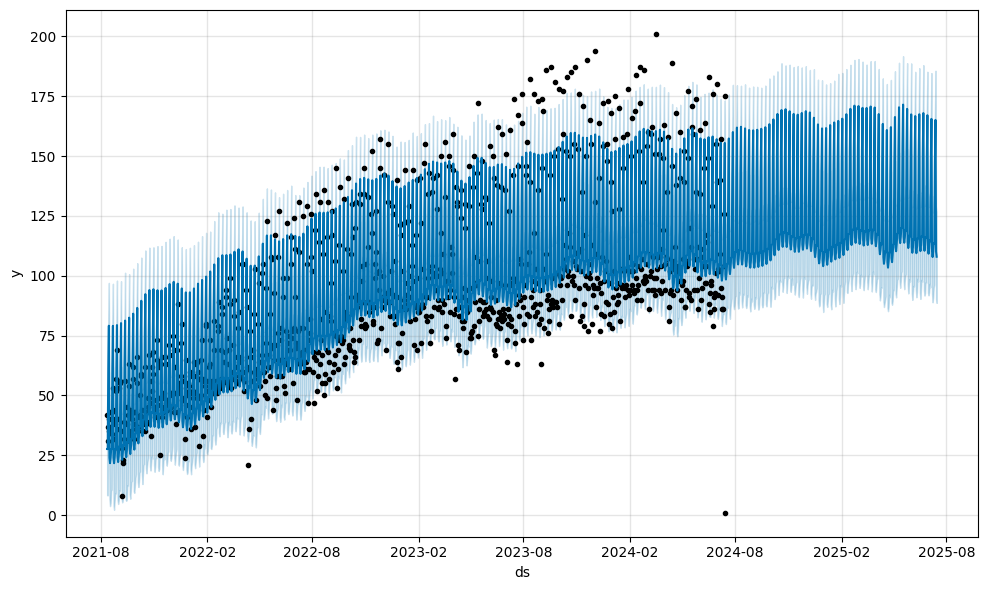

In [148]:
# Define the period for which we want a prediction (out-of-sample)
future = model.make_future_dataframe(periods=365)  # Extend by 365 days

# Use the model to make a forecast
forecast = model.predict(future)

# Summarize the forecast
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())

# Plot forecast
model.plot(forecast)
plt.show()


In [149]:
!pip install scikit-learn

14:22:11 - cmdstanpy - INFO - Chain [1] start processing
14:22:11 - cmdstanpy - INFO - Chain [1] done processing


MAE: 17.332


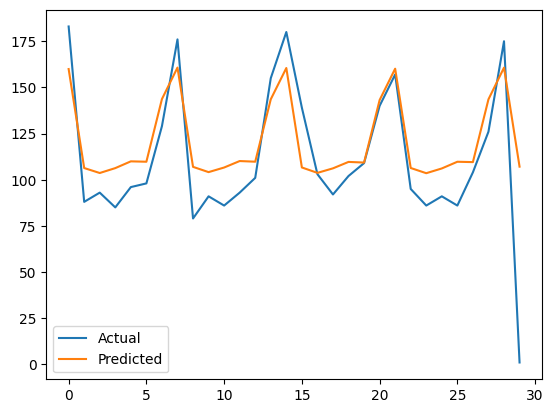

In [150]:
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt

# Create test dataset, remove last 30 days
train = daily_pickups[:-30]

# Define the model
model = Prophet()

# Fit the model
model.fit(train)

# Define the period for which we want a prediction (last 30 days)
future = daily_pickups['ds'][-30:]

# Use the model to make a forecast
forecast = model.predict(pd.DataFrame(future))

# Calculate MAE between expected and predicted values
y_true = daily_pickups['y'][-30:].values
y_pred = forecast['yhat'].values
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)

# Plot expected vs actual
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()


In [151]:
# Convert relevant columns to datetime
df['Actual Pickup Time'] = pd.to_datetime(df['Actual Pickup Time'], errors='coerce')
df['Actual Dropoff Time'] = pd.to_datetime(df['Actual Dropoff Time'], errors='coerce')

# Drop rows with NaT in 'Actual Pickup Time' or 'Actual Dropoff Time'
df = df.dropna(subset=['Actual Pickup Time', 'Actual Dropoff Time'])

# Extract additional time-based columns
df['date'] = df['Actual Pickup Time'].dt.date
df['month'] = df['Actual Pickup Time'].dt.to_period('M')
df['weekday'] = df['Actual Pickup Time'].dt.day_name()
df['hour'] = df['Actual Pickup Time'].dt.hour

print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
Index: 97869 entries, 0 to 160980
Data columns (total 54 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Request Creation Date           97869 non-null  object        
 1   Request Creation Time           97869 non-null  object        
 2   Session ID                      91104 non-null  float64       
 3   Request ID                      97869 non-null  int64         
 4   Series ID                       0 non-null      float64       
 5   Request Status                  97869 non-null  object        
 6   Rider ID                        97869 non-null  int64         
 7   Driver ID                       97550 non-null  object        
 8   Vehicle ID                      97869 non-null  float64       
 9   Latest shift ID                 0 non-null      float64       
 10  Is WAV Request                  97869 non-null  object        
 11  Number

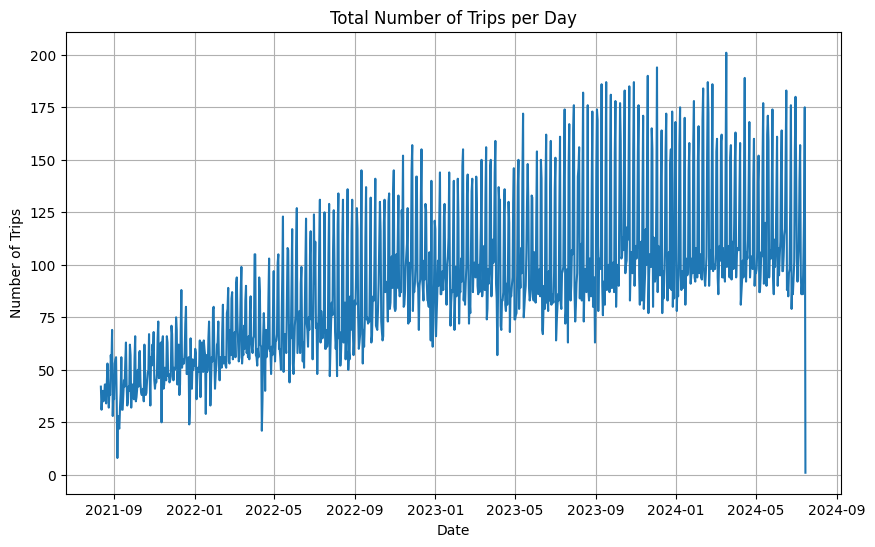

In [152]:
import matplotlib.pyplot as plt

# Calculate total trips per day
total_trips_daily = df.groupby('date').size()

# Plot total trips
plt.figure(figsize=(10, 6))
total_trips_daily.plot()
plt.title('Total Number of Trips per Day')
plt.xlabel('Date')
plt.ylabel('Number of Trips')
plt.grid(True)
plt.show()


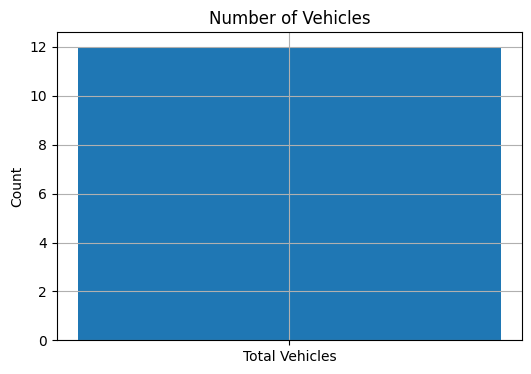

In [154]:
# Calculate the number of unique vehicles
num_vehicles = df['Vehicle ID'].nunique()

# Plot the number of vehicles
plt.figure(figsize=(6, 4))
plt.bar(['Total Vehicles'], [num_vehicles])
plt.title('Number of Vehicles')
plt.ylabel('Count')
plt.grid(True)
plt.show()


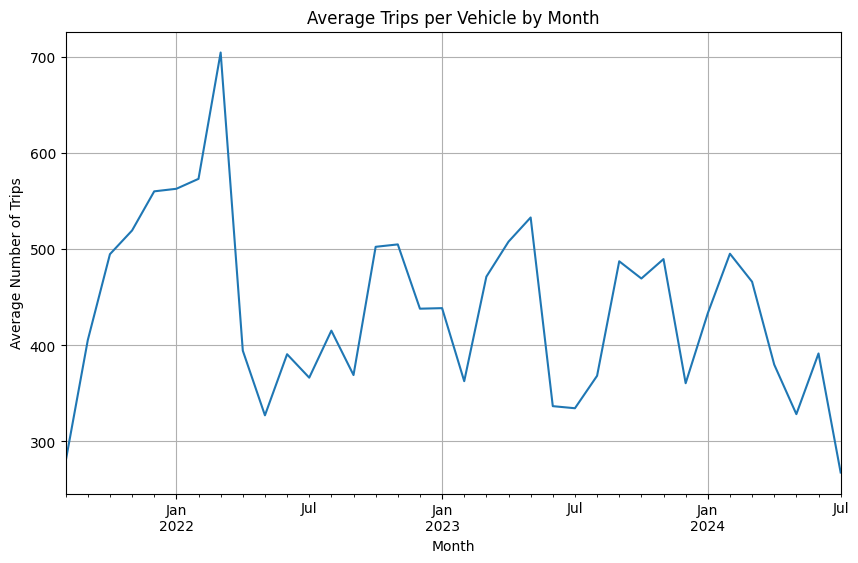

In [156]:
# Calculate average trips per vehicle per month
avg_trips_by_vehicle_month = df.groupby(['month', 'Vehicle ID']).size().groupby('month').mean()

# Plot average trips per vehicle by month
plt.figure(figsize=(10, 6))
avg_trips_by_vehicle_month.plot()
plt.title('Average Trips per Vehicle by Month')
plt.xlabel('Month')
plt.ylabel('Average Number of Trips')
plt.grid(True)
plt.show()


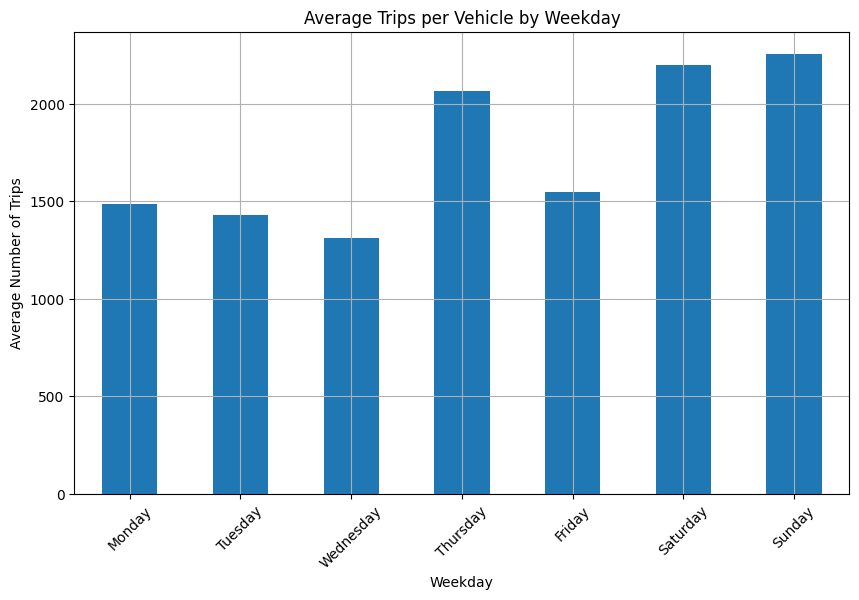

In [159]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure the weekdays are in the correct order from Monday to Sunday
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Calculate average trips per vehicle per weekday
avg_trips_by_vehicle_weekday = df.groupby(['weekday', 'Vehicle ID']).size().groupby('weekday').mean()

# Reindex to ensure the order of weekdays is correct
avg_trips_by_vehicle_weekday = avg_trips_by_vehicle_weekday.reindex(weekday_order)

# Plot average trips per vehicle by weekday
plt.figure(figsize=(10, 6))
avg_trips_by_vehicle_weekday.plot(kind='bar')
plt.title('Average Trips per Vehicle by Weekday')
plt.xlabel('Weekday')
plt.ylabel('Average Number of Trips')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


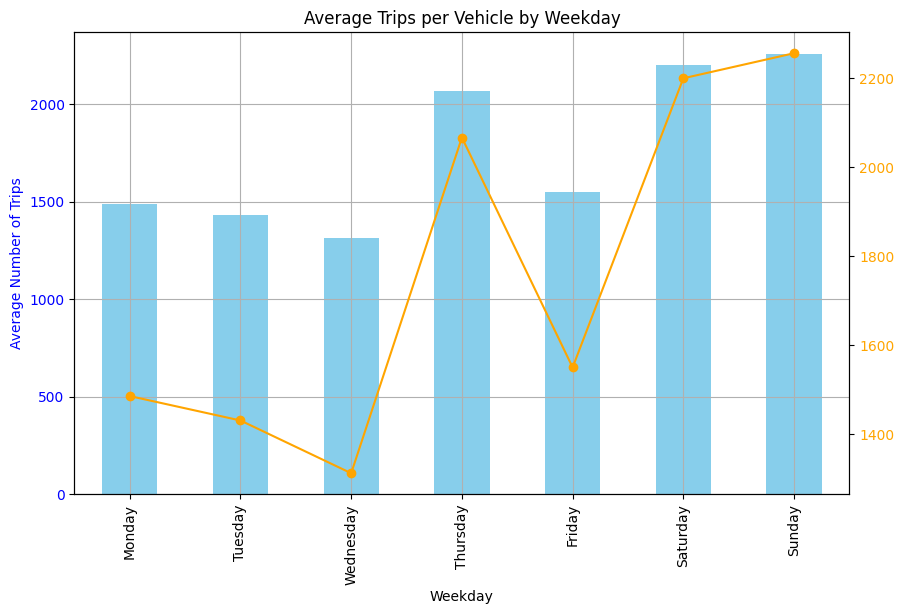

In [164]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure the weekdays are in the correct order from Monday to Sunday
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Calculate average trips per vehicle per weekday
avg_trips_by_vehicle_weekday = df.groupby(['weekday', 'Vehicle ID']).size().groupby('weekday').mean()

# Reindex to ensure the order of weekdays is correct
avg_trips_by_vehicle_weekday = avg_trips_by_vehicle_weekday.reindex(weekday_order)

# Plot average trips per vehicle by weekday
fig, ax1 = plt.subplots(figsize=(10, 6))

# Bar plot
avg_trips_by_vehicle_weekday.plot(kind='bar', ax=ax1, color='skyblue')
ax1.set_xlabel('Weekday')
ax1.set_ylabel('Average Number of Trips', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title('Average Trips per Vehicle by Weekday')
ax1.grid(True)

# Line plot
ax2 = ax1.twinx()
avg_trips_by_vehicle_weekday.plot(kind='line', ax=ax2, color='orange', marker='o')
ax2.tick_params(axis='y', labelcolor='orange')

plt.show()


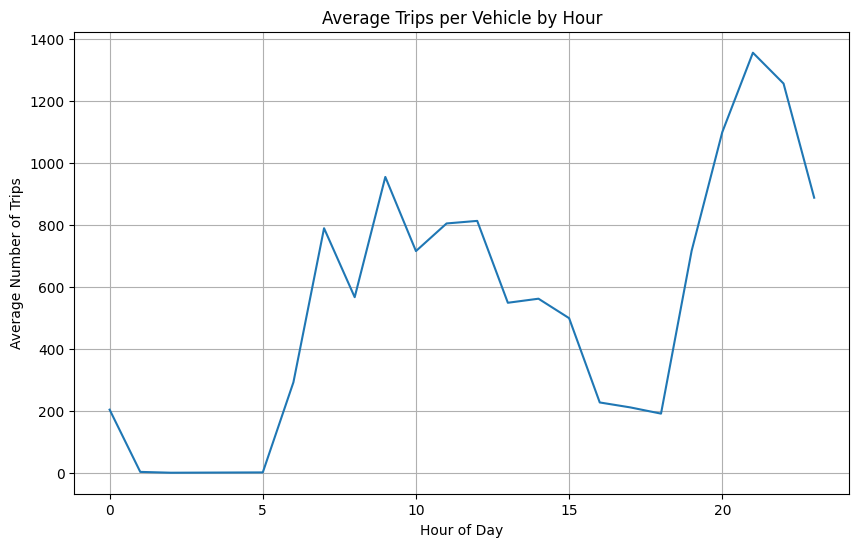

In [158]:
# Calculate average trips per vehicle per hour
avg_trips_by_vehicle_hour = df.groupby(['hour', 'Vehicle ID']).size().groupby('hour').mean()

# Plot average trips per vehicle by hour
plt.figure(figsize=(10, 6))
avg_trips_by_vehicle_hour.plot()
plt.title('Average Trips per Vehicle by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Average Number of Trips')
plt.grid(True)
plt.show()
